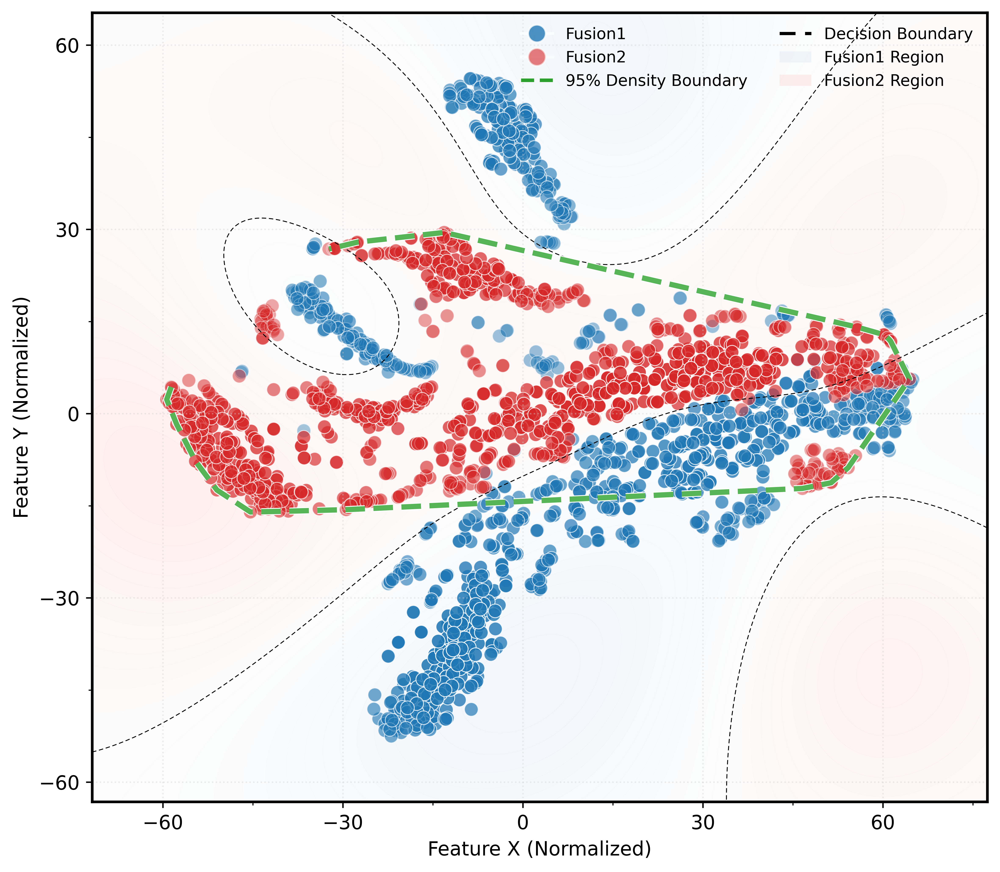

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib import patheffects
from matplotlib.ticker import AutoMinorLocator
from matplotlib.colors import LinearSegmentedColormap
from sklearn.manifold import TSNE
from sklearn.svm import SVC
from scipy.spatial import ConvexHull
from scipy.stats import gaussian_kde
from matplotlib.lines import Line2D

try:
    from skimage import measure
    SKIMAGE_AVAILABLE = True
except ImportError:
    SKIMAGE_AVAILABLE = False

class NatureColors:
    @property
    def palette(self):
        return {
            'fusion1': '#1f77b4',
            'fusion2': '#d62728',
            'boundary_line': '#2ca02c',
            'decision_area1': '#aec7e8',
            'decision_area2': '#ff9896',
            'dark_gray': '#2e3436'
        }

class PublicationVisualizer:
    def __init__(self):
        self.colors = NatureColors().palette
        self.__configure_style()
        self.custom_cmap = self.__create_decision_cmap()

    def __configure_style(self):
        plt.rcParams.update({
            'figure.dpi': 600,
            'axes.linewidth': 1.5,
            'font.size': 11,
            'font.family': 'DejaVu Sans',
            'legend.frameon': False
        })

    def __create_decision_cmap(self):
        return LinearSegmentedColormap.from_list(
            'decision_map',
            [self.colors['decision_area1'], '#f0f0f0', self.colors['decision_area2']],
            N=512
        )

    def __generate_transparency(self, data):
        kde = gaussian_kde(data.T)
        densities = kde(data.T)
        return np.interp(densities, (densities.min(), densities.max()), (0.4, 0.9))

    def __calculate_boundary(self, data):
        h = 1.5
        try:
            kde = gaussian_kde(data.T, bw_method=h/data.shape[0]**0.05)
            x_grid = np.linspace(data[:,0].min()-2, data[:,0].max()+2, 200)
            y_grid = np.linspace(data[:,1].min()-2, data[:,1].max()+2, 200)
            xx, yy = np.meshgrid(x_grid, y_grid)
            zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(xx.shape)
            
            if SKIMAGE_AVAILABLE:
                contours = measure.find_contours(zz, np.percentile(zz, 90))
                if contours:
                    contour = max(contours, key=len)
                    return xx[0][contour[:,1].astype(int)], yy[:,0][contour[:,0].astype(int)]
            hull = ConvexHull(data)
            return data[hull.vertices, 0], data[hull.vertices, 1]
        except:
            return data[:,0], data[:,1]

    def __draw_custom_legend(self, ax):
        legend_elements = [
            Line2D([0], [0], marker='o', color='w',
                  markerfacecolor=self.colors['fusion1'], markersize=10,
                  label='Fusion1', alpha=0.8),
            Line2D([0], [0], marker='o', color='w',
                  markerfacecolor=self.colors['fusion2'], markersize=10,
                  label='Fusion2', alpha=0.6),
            Line2D([0], [0], color=self.colors['boundary_line'], 
                  linestyle='--', linewidth=2,
                  label='95% Density Boundary'),
            Line2D([0], [0], color='black', linestyle=(0, (5, 3)), 
                  linewidth=1.8, label='Decision Boundary'),
            plt.Rectangle((0,0),1,1, fc=self.colors['decision_area1'], alpha=0.15,
                        edgecolor='none', label='Fusion1 Region'),
            plt.Rectangle((0,0),1,1, fc=self.colors['decision_area2'], alpha=0.15,
                        edgecolor='none', label='Fusion2 Region')
        ]
        ax.legend(handles=legend_elements, loc='upper right',
                 bbox_to_anchor=(1, 1), fontsize=9, ncol=2)

    def generate(self, data, labels, model):
        fig, ax = plt.subplots(figsize=(8, 7))
        
        # 动态范围计算
        x_buffer = 0.1 * np.ptp(data[:,0])
        y_buffer = 0.1 * np.ptp(data[:,1])
        xlim = (data[:,0].min()-x_buffer, data[:,0].max()+x_buffer)
        ylim = (data[:,1].min()-y_buffer, data[:,1].max()+y_buffer)
        
        # 创建网格
        xx, yy = np.meshgrid(np.linspace(*xlim, 300), 
                            np.linspace(*ylim, 300))
        Z = model.decision_function(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
        
        # ==== 决策区域填充 ====
        levels = np.linspace(Z.min(), Z.max(), 31)
        cs = ax.contourf(xx, yy, Z, levels=levels,
                       cmap=self.custom_cmap,
                       alpha=0.15,
                       zorder=0)
        
        # ==== 决策边界线（修改处）====
        cb = ax.contour(xx, yy, Z, levels=[0], 
                      colors='black',
                      linewidths=0.5,
                      linestyles=[(0, (5, 3))],  # 正确的线型参数格式
                      zorder=2)
        
        # ==== 数据分布边界线 ====
        data2 = data[labels==1]
        bx, by = self.__calculate_boundary(data2)
        ax.plot(bx, by, color=self.colors['boundary_line'], 
               linewidth=3, linestyle='--', alpha=0.8,
               path_effects=[patheffects.withStroke(linewidth=4, foreground='white')])
        
        # ==== 数据点绘制 ====
        alphas1 = self.__generate_transparency(data[labels==0])
        alphas2 = self.__generate_transparency(data[labels==1])
        ax.scatter(data[labels==0,0], data[labels==0,1], 
                  c=self.colors['fusion1'], s=60, 
                  edgecolors='white', linewidth=0.5, alpha=alphas1)
        ax.scatter(data[labels==1,0], data[labels==1,1],
                  c=self.colors['fusion2'], s=60, 
                  edgecolors='white', linewidth=0.5, alpha=alphas2)
        
        # ==== 图表装饰 ====
        ax.set(xlim=xlim, ylim=ylim,
              xlabel="Feature X (Normalized)", 
              ylabel="Feature Y (Normalized)")
        ax.xaxis.set_major_locator(plt.MaxNLocator(5))
        ax.yaxis.set_major_locator(plt.MaxNLocator(5))
        ax.xaxis.set_minor_locator(AutoMinorLocator(2))
        ax.yaxis.set_minor_locator(AutoMinorLocator(2))
        ax.grid(True, which='major', linestyle=':', color='#d0d0d0', alpha=0.4)
        self.__draw_custom_legend(ax)
        plt.tight_layout()
        return fig

def process_input_data():
    data1 = np.load('z_proj_6.npy')
    data2 = np.load('z_proj_2_6.npy')
    min_dim = min(data1.shape[1], data2.shape[1])
    combined = np.vstack([data1[:,:min_dim], data2[:,:min_dim]])
    tsne = TSNE(n_components=2, perplexity=35, random_state=42)
    labels = np.concatenate([np.zeros(len(data1)), np.ones(len(data2))])
    return tsne.fit_transform(combined), labels

if __name__ == "__main__":
    X, y = process_input_data()
    model = SVC(kernel='rbf', C=3, gamma='scale').fit(X, y)
    visualizer = PublicationVisualizer()
    fig = visualizer.generate(X, y, model)
    #plt.savefig('Final_Visualization.eps', format='eps', transparent=True, bbox_inches='tight')
    plt.show()


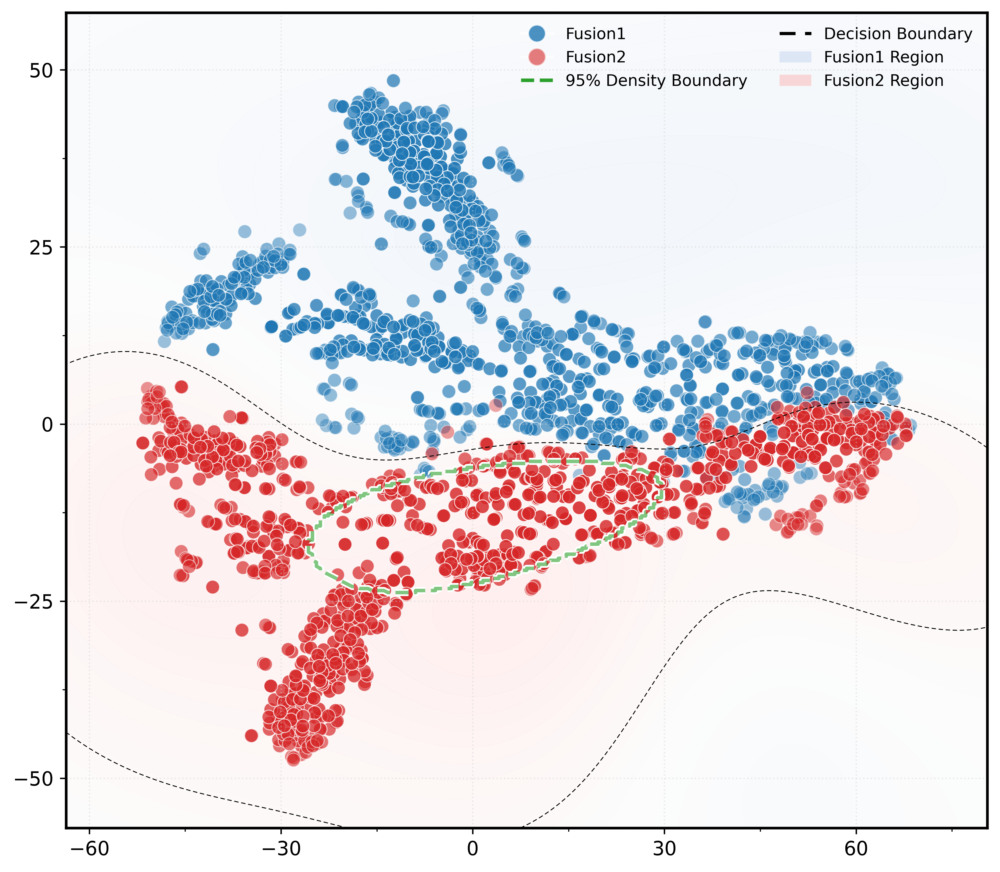

In [6]:
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib import patheffects
from matplotlib.ticker import AutoMinorLocator
from matplotlib.colors import LinearSegmentedColormap
from sklearn.manifold import TSNE
from sklearn.svm import SVC
from scipy.spatial import ConvexHull
from scipy.stats import gaussian_kde
from matplotlib.lines import Line2D

try:
    from skimage import measure
    SKIMAGE_AVAILABLE = True
except ImportError:
    SKIMAGE_AVAILABLE = False

class NatureColors:
    @property
    def palette(self):
        return {
            'fusion1': '#1f77b4',
            'fusion2': '#d62728',
            'boundary_line': '#2ca02c',
            'decision_area1': '#aec7e8',
            'decision_area2': '#ff9896',
            'dark_gray': '#2e3436'
        }

class PublicationVisualizer:
    def __init__(self):
        self.colors = NatureColors().palette
        self.__configure_style()
        self.custom_cmap = self.__create_decision_cmap()

    def __configure_style(self):
        plt.rcParams.update({
            'figure.dpi': 600,
            'axes.linewidth': 1.5,
            'font.size': 11,
            'font.family': 'DejaVu Sans',
            'legend.frameon': False
        })

    def __create_decision_cmap(self):
        return LinearSegmentedColormap.from_list(
            'decision_map',
            [self.colors['decision_area1'], '#f0f0f0', self.colors['decision_area2']],
            N=512
        )

    def __generate_transparency(self, data):
        kde = gaussian_kde(data.T)
        densities = kde(data.T)
        return np.interp(densities, (densities.min(), densities.max()), (0.4, 0.9))

    def __calculate_boundary(self, data):
        h = 1.5
        try:
            kde = gaussian_kde(data.T, bw_method=h/data.shape[0]**0.05)
            x_grid = np.linspace(data[:,0].min()-2, data[:,0].max()+2, 200)
            y_grid = np.linspace(data[:,1].min()-2, data[:,1].max()+2, 200)
            xx, yy = np.meshgrid(x_grid, y_grid)
            zz = kde(np.vstack([xx.ravel(), yy.ravel()])).reshape(xx.shape)
            
            if SKIMAGE_AVAILABLE:
                contours = measure.find_contours(zz, np.percentile(zz, 90))
                if contours:
                    contour = max(contours, key=len)
                    return xx[0][contour[:,1].astype(int)], yy[:,0][contour[:,0].astype(int)]
            hull = ConvexHull(data)
            return data[hull.vertices, 0], data[hull.vertices, 1]
        except:
            return data[:,0], data[:,1]

    def __draw_custom_legend(self, ax):
        legend_elements = [
            Line2D([0], [0], marker='o', color='w',
                  markerfacecolor=self.colors['fusion1'], markersize=10,
                  label='Fusion1', alpha=0.8),
            Line2D([0], [0], marker='o', color='w',
                  markerfacecolor=self.colors['fusion2'], markersize=10,
                  label='Fusion2', alpha=0.6),
            Line2D([0], [0], color=self.colors['boundary_line'], 
                  linestyle='--', linewidth=2,
                  label='95% Density Boundary'),
            Line2D([0], [0], color='black', linestyle=(0, (5, 3)), 
                  linewidth=1.8, label='Decision Boundary'),
            plt.Rectangle((0,0),1,1, fc=self.colors['decision_area1'], alpha=0.35,
                        edgecolor='none', label='Fusion1 Region'),
            plt.Rectangle((0,0),1,1, fc=self.colors['decision_area2'], alpha=0.35,
                        edgecolor='none', label='Fusion2 Region')
        ]
        ax.legend(handles=legend_elements, loc='upper right',
                 bbox_to_anchor=(1, 1), fontsize=9, ncol=2)

    def generate(self, data, labels, model):
        fig, ax = plt.subplots(figsize=(8, 7))
        
        # 动态范围计算
        x_buffer = 0.1 * np.ptp(data[:,0])
        y_buffer = 0.1 * np.ptp(data[:,1])
        xlim = (data[:,0].min()-x_buffer, data[:,0].max()+x_buffer)
        ylim = (data[:,1].min()-y_buffer, data[:,1].max()+y_buffer)
        
        # 创建网格
        xx, yy = np.meshgrid(np.linspace(*xlim, 300), 
                            np.linspace(*ylim, 300))
        Z = model.decision_function(np.c_[xx.ravel(), yy.ravel()]).reshape(xx.shape)
        
        # ==== 决策区域填充 ====
        levels = np.linspace(Z.min(), Z.max(), 31)
        cs = ax.contourf(xx, yy, Z, levels=levels,
                       cmap=self.custom_cmap,
                       alpha=0.15,
                       zorder=0)
        
        # ==== 决策边界线 ====
        cb = ax.contour(xx, yy, Z, levels=[0], 
                      colors='black',
                      linewidths=0.5,
                      linestyles=[(0, (5, 3))], 
                      zorder=2)
        
        # ==== 数据分布边界线 ====
        data2 = data[labels==1]
        bx, by = self.__calculate_boundary(data2)
        ax.plot(bx, by, color=self.colors['boundary_line'], 
               linewidth=2, linestyle='--', alpha=0.6,
               path_effects=[patheffects.withStroke(linewidth=4, foreground='white')])
        
        # ==== 数据点绘制 ====
        alphas1 = self.__generate_transparency(data[labels==0])
        alphas2 = self.__generate_transparency(data[labels==1])
        ax.scatter(data[labels==0,0], data[labels==0,1], 
                  c=self.colors['fusion1'], s=60, 
                  edgecolors='white', linewidth=0.5, alpha=alphas1)
        ax.scatter(data[labels==1,0], data[labels==1,1],
                  c=self.colors['fusion2'], s=60, 
                  edgecolors='white', linewidth=0.5, alpha=alphas2)
        
        # ==== 图表装饰 ====
        '''
        ax.set(xlim=xlim, ylim=ylim,
              xlabel="Feature X (Normalized)", 
              ylabel="Feature Y (Normalized)")
              
        '''
        ax.xaxis.set_major_locator(plt.MaxNLocator(5))
        ax.yaxis.set_major_locator(plt.MaxNLocator(5))
        ax.xaxis.set_minor_locator(AutoMinorLocator(2))
        ax.yaxis.set_minor_locator(AutoMinorLocator(2))
        ax.grid(True, which='major', linestyle=':', color='#d0d0d0', alpha=0.4)
        self.__draw_custom_legend(ax)
        plt.tight_layout()
        return fig

def process_input_data():
    data1 = np.load('z_proj_12.npy')
    data2 = np.load('z_proj_2_12.npy')
    min_dim = min(data1.shape[1], data2.shape[1])
    combined = np.vstack([data1[:,:min_dim], data2[:,:min_dim]])
    tsne = TSNE(n_components=2, perplexity=35, random_state=42)
    labels = np.concatenate([np.zeros(len(data1)), np.ones(len(data2))])
    return tsne.fit_transform(combined), labels

if __name__ == "__main__":
    X, y = process_input_data()
    model = SVC(kernel='rbf', C=3, gamma='scale').fit(X, y)
    visualizer = PublicationVisualizer()
    fig = visualizer.generate(X, y, model)
    #plt.savefig('./fusion1/visualization/Final_Visualization.svg', format='svg', transparent=True, bbox_inches='tight')
    plt.savefig('./fusion1/visualization/Final_Visualization_12.jpg', format='jpg', dpi=800, bbox_inches='tight')

    plt.show()


执行t-SNE降维...


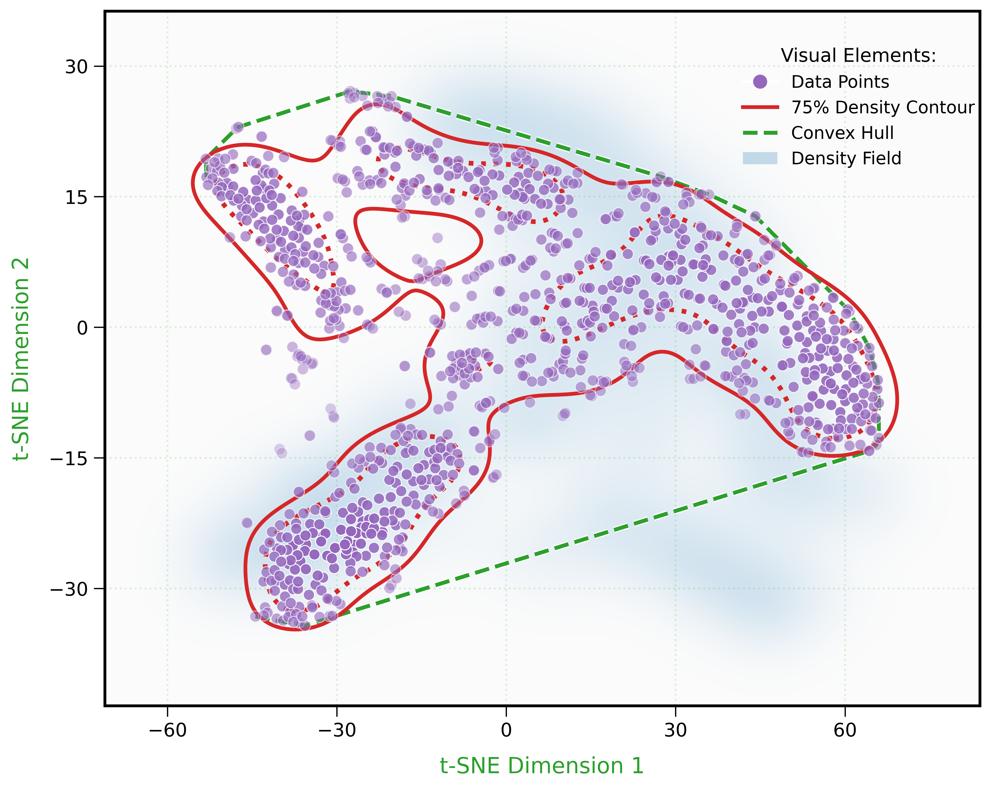

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib import patheffects
from matplotlib.ticker import AutoMinorLocator
from matplotlib.colors import LinearSegmentedColormap
from sklearn.manifold import TSNE
from scipy.spatial import ConvexHull
from scipy.stats import gaussian_kde
from matplotlib.lines import Line2D
from skimage import measure
import matplotlib.font_manager
class VisualStyle:
    @property
    def colors(self):
        return {
            'main': '#2ca02c',          # 主色调
            'density_fill': '#1f77b4',  # 密度填充色
            'contour_line': '#d62728',  # 轮廓线颜色
            'data_point': '#9467bd',    # 数据点颜色
            'background': '#f0f0f0'     # 背景色
        }
    @property
    def params(self):
        return {
            'figure_size': (10, 8),
            'dpi': 600,
            'major_tick_length': 7,
            'minor_tick_length': 4,
            'grid_alpha': 0.15,
            'contour_levels': 7,
            'density_alpha': 0.25
        }
class FeatureVisualizer:
    def __init__(self):
        self.style = VisualStyle()
        self.__configure_style()
        self.cmap = self.__create_cmap()
    def __configure_style(self):
        plt.rcParams.update({
            'figure.dpi': self.style.params['dpi'],
            'axes.linewidth': 1.8,
            'font.size': 12,
            'font.family': 'sans-serif',
            'legend.frameon': False,
            'axes.edgecolor': 'black',
            'xtick.color': 'black',
            'ytick.color': 'black',
        })
    def __create_cmap(self):
        return LinearSegmentedColormap.from_list(
            'density_cmap',
            [self.style.colors['background'], 
             self.style.colors['density_fill']],
            N=256
        )
    def __prepare_grid(self, data):
        """创建高精度网格系统"""
        x_min, x_max = data[:,0].min(), data[:,0].max()
        y_min, y_max = data[:,1].min(), data[:,1].max()
        x_buffer = 0.15 * max(x_max - x_min, 0.1)
        y_buffer = 0.15 * max(y_max - y_min, 0.1)
        return np.meshgrid(
            np.linspace(x_min-x_buffer, x_max+x_buffer, 500),
            np.linspace(y_min-y_buffer, y_max+y_buffer, 500)
        )
    def __calculate_kde(self, data):
        """带自适应带宽的核密度估计"""
        bw_factor = 0.8 / (data.shape[0]**0.2)
        kde = gaussian_kde(data.T, bw_method=bw_factor) 
        return kde
    def __enhance_contour(self, ax, density):
        """绘制多层次密度轮廓线"""
        levels = np.percentile(density, [75, 90])
        cs = ax.contour(density, levels=levels, 
                       colors=[self.style.colors['contour_line']],
                       linewidths=[2.4, 3.0],
                       linestyles=['-', ':'],
                       extent=[*ax.get_xlim(), *ax.get_ylim()],
                       zorder=2)
        return cs
    def visualize(self, data):
        """主可视化函数"""
        fig, ax = plt.subplots(figsize=self.style.params['figure_size'])
        # 计算核密度估计
        kde = self.__calculate_kde(data)
        xx, yy = self.__prepare_grid(data)
        grid_points = np.vstack([xx.ravel(), yy.ravel()])
        density = kde(grid_points).reshape(xx.shape)
        # 密度填充图
        im = ax.imshow(density.T, 
                      origin='lower',
                      extent=[xx.min(), xx.max(), yy.min(), yy.max()],
                      cmap=self.cmap,
                      alpha=self.style.params['density_alpha'],
                      aspect='auto',
                      zorder=0)
        # 多层次轮廓线
        self.__enhance_contour(ax, density)
        # 数据点渲染
        densities = kde(data.T)
        point_alpha = 0.3 + 0.7*(densities - densities.min())/(densities.max()-densities.min())
        ax.scatter(data[:,0], data[:,1],
                  c=self.style.colors['data_point'],
                  s=50,
                  edgecolors='white',
                  linewidth=0.6,
                  alpha=point_alpha,
                  zorder=3)
        # 凸包边界
        try:
            hull = ConvexHull(data)
            ax.plot(data[hull.vertices,0], data[hull.vertices,1],
                   color=self.style.colors['main'],
                   linewidth=2.5,
                   linestyle='--',
                   path_effects=[patheffects.withStroke(linewidth=4, foreground='white')],
                   zorder=1)
        except:
            pass
        # 坐标系统设置
        self.__setup_axes(ax)
        self.__add_legend(ax)
        return fig
    def __setup_axes(self, ax):
        """坐标系统精细调整"""
        ax.xaxis.set_major_locator(plt.MaxNLocator(6))
        ax.yaxis.set_major_locator(plt.MaxNLocator(6))
        ax.tick_params(axis='both', which='major', 
                      length=self.style.params['major_tick_length'])
        ax.tick_params(axis='both', which='minor',
                      length=self.style.params['minor_tick_length'])
        ax.grid(True, linestyle=':', linewidth=1.2,
               color=self.style.colors['main'], 
               alpha=self.style.params['grid_alpha'])
        ax.set_xlabel("t-SNE Dimension 1", 
                     fontsize=14, labelpad=10,
                     color=self.style.colors['main'])
        ax.set_ylabel("t-SNE Dimension 2", 
                     fontsize=14, labelpad=10,
                     color=self.style.colors['main'])
    def __add_legend(self, ax):
        """定制化图例系统"""
        legend_elements = [
            Line2D([0], [0], marker='o', color='w',
                  markerfacecolor=self.style.colors['data_point'],
                  markersize=10, markeredgecolor='white',
                  label='Data Points'),
            Line2D([0], [0], color=self.style.colors['contour_line'],
                  linestyle='-', linewidth=2.4,
                  label='75% Density Contour'),
            Line2D([0], [0], color=self.style.colors['main'],
                  linestyle='--', linewidth=2.5,
                  label='Convex Hull'),
            plt.Rectangle((0,0),1,1, fc=self.style.colors['density_fill'],
                        alpha=self.style.params['density_alpha'],
                        edgecolor='none', label='Density Field')
        ]
        ax.legend(handles=legend_elements,
                 loc='upper right',
                 bbox_to_anchor=(1.02, 0.98),
                 framealpha=0.95,
                 fontsize=11,
                 title='Visual Elements:',
                 title_fontsize=12,
                 borderpad=0.8)
def process_data(input_file):
    """数据预处理流程"""
    raw_data = np.load(input_file)
    # 自动维度选择
    if raw_data.shape[1] > 2:
        print("执行t-SNE降维...")
        tsne = TSNE(n_components=2, perplexity=30,
                   init='pca', random_state=42)
        return tsne.fit_transform(raw_data)
    return raw_data
if __name__ == "__main__":
    # 使用说明
    input_file = "z_proj_2_12.npy"  # 更改为你的文件路径
    # 数据处理
    data = process_data(input_file)
    # 可视化流程
    visualizer = FeatureVisualizer()
    fig = visualizer.visualize(data)
    plt.savefig('./fusion1/sig-hab/Final_Visualization_12.jpg', format='jpg', dpi=800, bbox_inches='tight')

    plt.show()
    
    # 保存输出
    '''
    plt.savefig('feature_visualization.pdf', 
               format='pdf', 
               bbox_inches='tight',
               transparent=True,
               dpi=600)
    plt.show()
    '''

In [43]:
import numpy as np 
import os
import matplotlib.pyplot as plt
from matplotlib import patheffects
from matplotlib.ticker import AutoMinorLocator
from matplotlib.colors import LinearSegmentedColormap
from sklearn.manifold import TSNE
from scipy.spatial import ConvexHull
from scipy.stats import gaussian_kde
from matplotlib.lines import Line2D
import matplotlib as mpl
import sys
# 添加后端声明（必须在所有matplotlib导入前）
mpl.use('Agg')  # 强制使用支持jpg保存的后端

class VisualStyle:
    @property
    def colors(self):
        return {
            'main': '#2ca02c',          # 模态交互边界颜色
            'density_fill': '#1f77b4',  # 稳定语义区域填充色
            'contour_line': '#d62728',  # 动态对齐轮廓线颜色
            'data_point': '#9467bd',    # 融合特征点颜色
            'background': '#f0f0f0'     # 背景色
        }

    @property
    def params(self):
        return {
            'figure_size': (10, 8),
            'dpi': 600,
            'major_tick_length': 7,
            'minor_tick_length': 4,
            'grid_alpha': 0.15,
            'contour_levels': 7,
            'density_alpha': 0.25
        }

class FeatureVisualizer:
    def __init__(self):
        self.style = VisualStyle()
        self.__configure_style()
        self.cmap = self.__create_cmap()
    
    def __configure_style(self):
        plt.rcParams.update({
            'figure.dpi': self.style.params['dpi'],
            'axes.linewidth': 1.8,
            'font.size': 12,
            'font.family': 'DejaVu Sans',
            'legend.frameon': False,
            'axes.edgecolor': 'black',
            'xtick.color': 'black',
            'ytick.color': 'black',
        })
    
    def __create_cmap(self):
        return LinearSegmentedColormap.from_list(
            'density_cmap',
            [self.style.colors['background'], 
             self.style.colors['density_fill']],
            N=256
        )
    
    def __prepare_grid(self, data):
        x_min, x_max = data[:,0].min(), data[:,0].max()
        y_min, y_max = data[:,1].min(), data[:,1].max()
        x_buffer = 0.15 * max(x_max - x_min, 0.1)
        y_buffer = 0.15 * max(y_max - y_min, 0.1)
        return np.meshgrid(
            np.linspace(x_min - x_buffer, x_max + x_buffer, 500),
            np.linspace(y_min - y_buffer, y_max + y_buffer, 500)
        )
    
    def __calculate_kde(self, data):
        data = data[~np.isnan(data).any(axis=1)]
        if len(data) < 10:
            return None  # 数据不足返回空
        bw_factor = 0.8 / (len(data)**0.2)
        return gaussian_kde(data.T, bw_method=bw_factor)
    
    def __enhance_contour(self, ax, density):
        valid_density = density[~np.isnan(density)]
        if len(valid_density) == 0:
            return
        levels = np.percentile(valid_density, [75, 90])
        cs = ax.contour(density, levels=levels, 
                        colors=[self.style.colors['contour_line']],
                        linewidths=[2.4, 3.0],
                        linestyles=['-', ':'],
                        extent=[*ax.get_xlim(), *ax.get_ylim()],
                        zorder=2)
        return cs
    
    def visualize(self, data):
        fig, ax = plt.subplots(figsize=self.style.params['figure_size'])
        
        # 数据清洗
        clean_data = data[~np.isnan(data).any(axis=1)]
        if len(clean_data) < 10:
            print("有效数据不足无法可视化")
            return fig
        
        # 计算密度场
        kde = self.__calculate_kde(clean_data)
        if kde is None:
            return fig
        
        xx, yy = self.__prepare_grid(clean_data)
        grid_points = np.vstack([xx.ravel(), yy.ravel()])
        try:
            density = kde(grid_points).reshape(xx.shape)
        except:
            return fig
        
        # 绘制密度场
        im = ax.imshow(density.T, 
                       origin='lower',
                       extent=[xx.min(), xx.max(), yy.min(), yy.max()],
                       cmap=self.cmap,
                       alpha=self.style.params['density_alpha'],
                       aspect='auto',
                       zorder=0)
        
        # 动态和静态等高线
        self.__enhance_contour(ax, density)
        
        # 融合特征点
        densities = kde(clean_data.T)
        point_alpha = 0.3 + 0.7 * (densities - densities.min()) / (densities.max() - densities.min())
        ax.scatter(clean_data[:,0], clean_data[:,1],
                   c=self.style.colors['data_point'],
                   s=50,
                   edgecolors='white',
                   linewidth=0.6,
                   alpha=point_alpha,
                   zorder=3)
        
        # 模态交互边界
        try:
            hull = ConvexHull(clean_data)
            ax.plot(clean_data[hull.vertices, 0], clean_data[hull.vertices, 1],
                    color=self.style.colors['main'],
                    linewidth=2.5,
                    linestyle='--',
                    path_effects=[patheffects.withStroke(linewidth=4, foreground='white')],
                    zorder=1)
        except:
            pass

        
        # 坐标系统
        self.__setup_axes(ax)
        self.__add_legend(ax)
        return fig
    
    def __setup_axes(self, ax):
        ax.xaxis.set_major_locator(plt.MaxNLocator(6))
        ax.yaxis.set_major_locator(plt.MaxNLocator(6))
        ax.tick_params(axis='both', which='major', 
                       length=self.style.params['major_tick_length'])
        ax.tick_params(axis='both', which='minor',
                       length=self.style.params['minor_tick_length'])
        ax.grid(True, linestyle=':', linewidth=1.2,
                color=self.style.colors['main'], 
                alpha=self.style.params['grid_alpha'])

    def __add_legend(self, ax):
        """精简版图例系统"""
        legend_elements = [
            Line2D([0], [0], color=self.style.colors['contour_line'],
                   linestyle='-', linewidth=2.8,
                   label='Dynamic boundary'),
            
            Line2D([0], [0], color=self.style.colors['contour_line'],
                   linestyle=':', linewidth=3.2,
                   label='Static boundary'),
            
            Line2D([0], [0], color=self.style.colors['main'],
                   linestyle='--', linewidth=2.2,
                   label='Dynamic-Static boundary'),
            
            plt.Rectangle((0, 0), 1, 1, fc=self.style.colors['density_fill'],
                          alpha=self.style.params['density_alpha'],
                          edgecolor='none', label='Stable Region')
        ]
        ax.legend(
            handles=legend_elements,
            loc='upper right',
            bbox_to_anchor=(0.38, 0.98),
            framealpha=0.92,
            title_fontsize=12,
            fontsize=11,
            handlelength=2.8,
            columnspacing=0.8,
            handletextpad=0.8,
            borderpad=0.6,
            labelspacing=0.8
        )

def process_data(input_file):
    try:
        raw_data = np.load(input_file)
        if raw_data.shape[1] > 2:
            tsne = TSNE(n_components=2, perplexity=30,
                        init='pca', random_state=42,
                        early_exaggeration=12)
            return tsne.fit_transform(raw_data)
        return raw_data
    except Exception as e:
        print(f"数据处理失败: {str(e)}")
        exit()

# 修改保存函数部分
if __name__ == "__main__":
    input_file = "z_proj_5.npy"
    output_dir = "./fusion1/sig-hab"    
    output_path = os.path.join(output_dir, "sig-hab_5.jpg")

    os.makedirs(output_dir, exist_ok=True)
    
    try:
        data = process_data(input_file)
        visualizer = FeatureVisualizer()
        fig = visualizer.visualize(data)
        
        # Jupyter适配保存参数
        fig.savefig(
            output_path,
            format='jpg',
            dpi=600,  # 提高分辨率至600DPI
            bbox_inches='tight',
            facecolor='white',  # 强制白色背景
            # 根据Pillow支持添加质量参数
            pil_kwargs={'quality': 95} if 'PIL' in sys.modules else {}
        )
        plt.show()  # 在Notebook中显示图像
        plt.close(fig)
        print(f"✓ 保存成功: {output_path}")
        
        
    except Exception as e:
        print(f"错误: {str(e)}")
        plt.close('all')



✓ 保存成功: ./fusion1/sig-hab/sig-hab_5.jpg


/tmp/ipykernel_1488354/355940743.py:237: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()  # 在Notebook中显示图像
